<a href="https://colab.research.google.com/github/Basel-Amr/Deep_Learning_Repository/blob/main/Animal_Classification/Animal_Classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import os
os.chdir('/content/drive/MyDrive/Machine&Deep_LearningProjects/02-Animal_Classifications')

# **0.  Setup**

In [3]:
import torch
device = "cuda" if torch.cuda.is_available() else "cpu"
device

'cpu'

# **1.  Imports**

In [4]:
import torch
from torch import nn

from torch.utils.data import DataLoader, random_split
import random

import warnings
warnings.filterwarnings("ignore")

try:
    from torchinfo import summary
except:
    print("[INFO] Couldn't find torchinfo... installing it.")
    !pip install -q torchinfo
    from torchinfo import summary

import torchvision
from torchvision import datasets, transforms
from pathlib import Path
from typing import Tuple, Dict, List
import numpy as np

from matplotlib import pyplot as plt

from PIL import Image

import pandas as pd

import time

import multiprocessing

try:
  import splitfolders
except:
  !pip install split-folders
  import splitfolders
from timeit import default_timer as timer

from going_modular.going_modular import utils, model_builder,data_setup, engine, predictions
from helper_functions import set_seeds, plot_loss_curves, walk_through_dir,pred_and_plot_image

[INFO] Couldn't find torchinfo... installing it.


In [5]:
# to get packages initially installed in colab or in other word, the colab environment
!pip3 freeze > requirements.txt

# **2.  Data**

## 2.1 Setup directory

In [5]:
input_file = Path("/content/drive/MyDrive/Machine&Deep_LearningProjects/02-Animal_Classifications/going_modular/data")
output_file = Path("/content/drive/MyDrive/Machine&Deep_LearningProjects/02-Animal_Classifications/going_modular/data_splitted")
model_path = Path("/content/drive/MyDrive/Machine&Deep_LearningProjects/02-Animal_Classifications/going_modular/models")
metric_path = Path("/content/drive/MyDrive/Machine&Deep_LearningProjects/02-Animal_Classifications/going_modular/Evaluations")

##2.2 Walk though our data

In [7]:
walk_through_dir(input_file)

There are 15 directories and 0 images in '/content/drive/MyDrive/Machine&Deep_LearningProjects/02-Animal_Classifications/going_modular/data'.
There are 0 directories and 125 images in '/content/drive/MyDrive/Machine&Deep_LearningProjects/02-Animal_Classifications/going_modular/data/Bear'.
There are 0 directories and 123 images in '/content/drive/MyDrive/Machine&Deep_LearningProjects/02-Animal_Classifications/going_modular/data/Cat'.
There are 0 directories and 122 images in '/content/drive/MyDrive/Machine&Deep_LearningProjects/02-Animal_Classifications/going_modular/data/Dog'.
There are 0 directories and 131 images in '/content/drive/MyDrive/Machine&Deep_LearningProjects/02-Animal_Classifications/going_modular/data/Cow'.
There are 0 directories and 137 images in '/content/drive/MyDrive/Machine&Deep_LearningProjects/02-Animal_Classifications/going_modular/data/Bird'.
There are 0 directories and 129 images in '/content/drive/MyDrive/Machine&Deep_LearningProjects/02-Animal_Classifications

##2.3  Split the data

We are going to split the data into three main directories
1.  `Train dataset`  80%  - The sample of data used to fit the model.
The actual dataset that we use to train the model (weights and biases in the case of a Neural Network). The model sees and learns from this data.
2.  `Validate dataset`  10%  - The sample of data used to provide an unbiased evaluation of a model fit on the training dataset while tuning model hyperparameters. The evaluation becomes more biased as skill on the validation dataset is incorporated into the model configuration.
3.  `Test dataset`  10% -   The sample of data used to provide an unbiased evaluation of a final model fit on the training dataset.

In [ ]:
splitfolders.ratio(input = input_file, output = output_file, seed = 42, ratio = (0.8,0.1,0.1), group_prefix=None)

Copying files: 1944 files [02:10, 14.90 files/s]


##2.4  Setup train, val and test pathes

In [6]:
train_data_path = output_file/"train"
val_data_path = output_file/"val"
test_data_path = output_file/"test"

##2.5 Visualize some of our data

In [7]:
dataset = datasets.ImageFolder(input_file)
class_names = dataset.classes
print(f"Number of classes :{len(class_names)} | Class names : {class_names}")

Number of classes :15 | Class names : ['Bear', 'Bird', 'Cat', 'Cow', 'Deer', 'Dog', 'Dolphin', 'Elephant', 'Giraffe', 'Horse', 'Kangaroo', 'Lion', 'Panda', 'Tiger', 'Zebra']


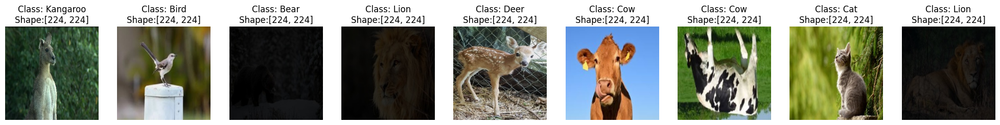

In [10]:
data_setup.display_random_images(data_dir = input_file,
                                 transforms=None,
                                 fig_size = (25,15),
                                 n = 9,
                                 seed = 42,
                                 permute = False)

# **3. Model**

Before converting our data into dataloaders, we have to know what Preprocessing what we should do to our data.

We are going to try transfer model, each model is already trained in data with specific preprocessing, we should try to make our data in the same preprocessor of the data which the model are trained on.

We are going to try the following models

1.  ResNet50
2.  ResNet18
3.  alexnet
4.  efficientnet_b0
5.  MobileNet
6.  EfficientNet_V2



##3.1 ResNet50

###  3.1.1 ResNet50 Preprocessing

[ResNet50](https://pytorch.org/vision/stable/models/generated/torchvision.models.resnet50.html#torchvision.models.resnet50)



```
IMAGENET1K_V1.transforms and perform the following preprocessing
operations: Accepts PIL.Image, batched (B, C, H, W) and single (C, H, W) image torch.Tensor objects.
The images are resized to resize_size=[232]
followed by a central crop of crop_size=[224].
Finally the values are first rescaled to [0.0, 1.0]
and then normalized using mean=[0.485, 0.456, 0.406] and std=[0.229, 0.224, 0.225].


```



In [11]:
# Make an empty List contains all the models, it will be used to store our models to track them automatically
models = []

resnet_50_model , resnet_50_transforms = model_builder.create_ResNet50(number_of_classes=len(class_names),
                                                                         trainable = False,
                                                                         trainable_layers = 0,
                                                                        device = device)

models.append(resnet_50_model)

Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 155MB/s]


[INFO] Created new ResNet_50 model.
[INFO] With classifier layer Linear(in_features=2048, out_features=15, bias=True)


In [12]:
resnet_50_transforms

ImageClassification(
    crop_size=[224]
    resize_size=[232]
    mean=[0.485, 0.456, 0.406]
    std=[0.229, 0.224, 0.225]
    interpolation=InterpolationMode.BILINEAR
)



###3.1.2  ResNet50 Summary

In [13]:
summary(resnet_50_model,
        input_size=(32, 3, 224, 224), # make sure this is "input_size", not "input_shape" (batch_size, color_channels, height, width)
        verbose=0,
        col_names=["input_size", "output_size", "num_params", "trainable"],
        col_width=20,
        row_settings=["var_names"]
)

Layer (type (var_name))                  Input Shape          Output Shape         Param #              Trainable
ResNet (ResNet)                          [32, 3, 224, 224]    [32, 15]             --                   Partial
├─Conv2d (conv1)                         [32, 3, 224, 224]    [32, 64, 112, 112]   9,408                True
├─BatchNorm2d (bn1)                      [32, 64, 112, 112]   [32, 64, 112, 112]   128                  True
├─ReLU (relu)                            [32, 64, 112, 112]   [32, 64, 112, 112]   --                   --
├─MaxPool2d (maxpool)                    [32, 64, 112, 112]   [32, 64, 56, 56]     --                   --
├─Sequential (layer1)                    [32, 64, 56, 56]     [32, 256, 56, 56]    --                   False
│    └─Bottleneck (0)                    [32, 64, 56, 56]     [32, 256, 56, 56]    --                   False
│    │    └─Conv2d (conv1)               [32, 64, 56, 56]     [32, 64, 56, 56]     (4,096)              False
│    │    └─

###  3.1.3 ResNet50 DataLoader

In [14]:
train_dataloader = []
test_dataloader = []
val_dataloader = []

In [15]:
train_dataloader_ResNet50, val_dataloader_ResNet50, test_dataloader_ResNet50, class_names = data_setup.create_dataloaders(train_dir = train_data_path,
                                                                                                             test_dir = test_data_path,
                                                                                                             val_dir = val_data_path,
                                                                                                             train_transform = resnet_50_transforms,
                                                                                                             val_transform = resnet_50_transforms,
                                                                                                             test_transform = resnet_50_transforms,
                                                                                                             batch_size = 32,
                                                                                                             num_workers = os.cpu_count())
train_dataloader.append(train_dataloader_ResNet50)
val_dataloader.append(val_dataloader_ResNet50)
test_dataloader.append(test_dataloader_ResNet50)

Print some information about our dataloaders such as
* Print the shape of our data
* Print Number of Batches
* Print class names
* Number of datapoints
* Transformation Used

In [16]:
print(train_dataloader_ResNet50.dataset)
print(f"Number of Batches: {len(train_dataloader_ResNet50)} | Batch_size: {train_dataloader_ResNet50.batch_size}")
print(f"The Classes of the model are: {len(class_names)} | Number of classes: {class_names}")

Dataset ImageFolder
    Number of datapoints: 1549
    Root location: /content/drive/MyDrive/Machine&Deep_LearningProjects/02-Animal_Classifications/going_modular/data_splitted/train
    StandardTransform
Transform: ImageClassification(
               crop_size=[224]
               resize_size=[232]
               mean=[0.485, 0.456, 0.406]
               std=[0.229, 0.224, 0.225]
               interpolation=InterpolationMode.BILINEAR
           )
Number of Batches: 49 | Batch_size: 32
The Classes of the model are: 15 | Number of classes: ['Bear', 'Bird', 'Cat', 'Cow', 'Deer', 'Dog', 'Dolphin', 'Elephant', 'Giraffe', 'Horse', 'Kangaroo', 'Lion', 'Panda', 'Tiger', 'Zebra']


In [17]:
img, label = next(iter(train_dataloader_ResNet50))

print(f"Image Shape : {img.shape} -> [batch_size, color_channel, height, width]")
print(f"Label shape: {label.shape}")

Image Shape : torch.Size([32, 3, 224, 224]) -> [batch_size, color_channel, height, width]
Label shape: torch.Size([32])


###3.1.4  Display some of the transformed images

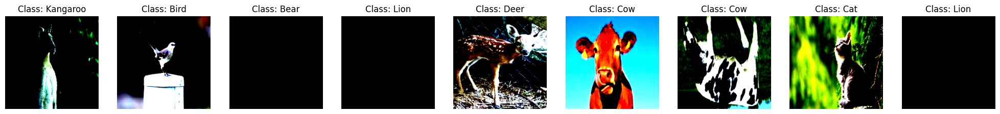

In [18]:
data_setup.display_random_images(data_dir = input_file,
                                 transforms=resnet_50_transforms,
                                 fig_size = (25,15),
                                 n = 9,
                                 seed = 42,
                                 display_shape = False,
                                 permute = True)

###3.1.5 Choose a random image to test your model

In [19]:
# Choose a ranodom numer
batch_size = train_dataloader_ResNet50.batch_size
random_samples_idx = random.randint(0, batch_size)
random_img = img[random_samples_idx].unsqueeze(dim=0).to(device)
random_label = label[random_samples_idx]
# Pass the random image tensor to our ResNet_50 instance
y_pred=resnet_50_model(random_img)
y_pred_class = torch.argmax(torch.softmax(y_pred, dim=1), dim=1)
print(f"The Actual class is :{class_names[random_label]} | The Predicted class is:{class_names[y_pred_class]}")
print(f"The Shape of the predicted class is {y_pred.shape}")

The Actual class is :Bear | The Predicted class is:Bear
The Shape of the predicted class is torch.Size([1, 15])


###3.1.5 Setup the model

In [20]:
loss_fun_resnet_50 = nn.CrossEntropyLoss()
optimizer_resnet_50_model = torch.optim.Adam(resnet_50_model.parameters())

##3.2 ResNet18

###3.2.1 ResNet18 Preprocessing

[ResNet18](https://pytorch.org/vision/stable/models/generated/torchvision.models.resnet18.html)

```
ResNet18_Weights.IMAGENET1K_V1.transforms and perform the following preprocessing
operations: Accepts PIL.Image, batched (B, C, H, W) and single (C, H, W) image torch.Tensor objects.
The images are resized to resize_size=[256]
followed by a central crop of crop_size=[224].
Finally the values are first rescaled to [0.0, 1.0]
and then normalized using mean=[0.485, 0.456, 0.406] and std=[0.229, 0.224, 0.225].


```

In [21]:
set_seeds
resnet_18_model , resnet_18_transform = model_builder.create_ResNet18(number_of_classes= len(class_names),
                                                                      trainable = False,
                                                                      trainable_layers = 0,
                                                                      device = device)

models.append(resnet_18_model)

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 92.0MB/s]

[INFO] Created new ResNet_18 model.
[INFO] With classifier layer Linear(in_features=512, out_features=15, bias=True)


In [22]:
resnet_18_transform

ImageClassification(
    crop_size=[224]
    resize_size=[256]
    mean=[0.485, 0.456, 0.406]
    std=[0.229, 0.224, 0.225]
    interpolation=InterpolationMode.BILINEAR
)

###3.2.2  ResNet50 Summary

In [23]:
summary(resnet_18_model,
        input_size=(32, 3, 224, 224), # make sure this is "input_size", not "input_shape" (batch_size, color_channels, height, width)
        verbose=0,
        col_names=["input_size", "output_size", "num_params", "trainable"],
        col_width=20,
        row_settings=["var_names"]
)

Layer (type (var_name))                  Input Shape          Output Shape         Param #              Trainable
ResNet (ResNet)                          [32, 3, 224, 224]    [32, 15]             --                   Partial
├─Conv2d (conv1)                         [32, 3, 224, 224]    [32, 64, 112, 112]   9,408                True
├─BatchNorm2d (bn1)                      [32, 64, 112, 112]   [32, 64, 112, 112]   128                  True
├─ReLU (relu)                            [32, 64, 112, 112]   [32, 64, 112, 112]   --                   --
├─MaxPool2d (maxpool)                    [32, 64, 112, 112]   [32, 64, 56, 56]     --                   --
├─Sequential (layer1)                    [32, 64, 56, 56]     [32, 64, 56, 56]     --                   False
│    └─BasicBlock (0)                    [32, 64, 56, 56]     [32, 64, 56, 56]     --                   False
│    │    └─Conv2d (conv1)               [32, 64, 56, 56]     [32, 64, 56, 56]     (36,864)             False
│    │    └─

###  3.2.3 ResNet50 DataLoader

In [24]:
train_dataloader_ResNet18, val_dataloader_ResNet18, test_dataloader_ResNet18, class_names = data_setup.create_dataloaders(train_dir = train_data_path,
                                                                                                             test_dir = test_data_path,
                                                                                                             val_dir = val_data_path,
                                                                                                             train_transform = resnet_18_transform,
                                                                                                             val_transform = resnet_18_transform,
                                                                                                             test_transform = resnet_18_transform,
                                                                                                             batch_size = 32,
                                                                                                             num_workers = os.cpu_count())
train_dataloader.append(train_dataloader_ResNet18)
val_dataloader.append(val_dataloader_ResNet18)
test_dataloader.append(test_dataloader_ResNet18)

Print some information about our dataloaders such as
* Print the shape of our data
* Print Number of Batches
* Print class names
* Number of datapoints
* Transformation Used

In [25]:
print(train_dataloader_ResNet18.dataset)
print(f"Number of Batches: {len(train_dataloader_ResNet18)} | Batch_size: {train_dataloader_ResNet18.batch_size}")
print(f"The Classes of the model are: {len(class_names)} | Number of classes: {class_names}")

Dataset ImageFolder
    Number of datapoints: 1549
    Root location: /content/drive/MyDrive/Machine&Deep_LearningProjects/02-Animal_Classifications/going_modular/data_splitted/train
    StandardTransform
Transform: ImageClassification(
               crop_size=[224]
               resize_size=[256]
               mean=[0.485, 0.456, 0.406]
               std=[0.229, 0.224, 0.225]
               interpolation=InterpolationMode.BILINEAR
           )
Number of Batches: 49 | Batch_size: 32
The Classes of the model are: 15 | Number of classes: ['Bear', 'Bird', 'Cat', 'Cow', 'Deer', 'Dog', 'Dolphin', 'Elephant', 'Giraffe', 'Horse', 'Kangaroo', 'Lion', 'Panda', 'Tiger', 'Zebra']


###3.2.4 Display some of transformed images

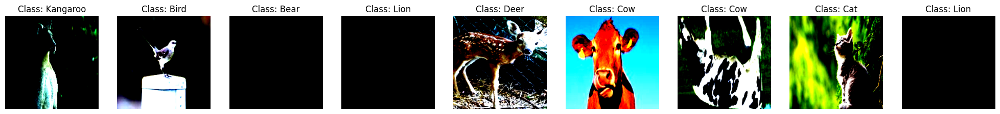

In [26]:
data_setup.display_random_images(data_dir = input_file,
                                 transforms=resnet_18_transform,
                                 fig_size = (25,15),
                                 n = 9,
                                 seed = 42,
                                 display_shape = False,
                                 permute = True)

In [27]:
img, label = next(iter(train_dataloader_ResNet18))

print(f"Image Shape : {img.shape} -> [batch_size, color_channel, height, width]")
print(f"Label shape: {label.shape}")

Image Shape : torch.Size([32, 3, 224, 224]) -> [batch_size, color_channel, height, width]
Label shape: torch.Size([32])


###3.2.4 Choose a random image to test your model

In [28]:
# Choose a ranodom numer
batch_size = train_dataloader_ResNet18.batch_size
random_samples_idx = random.randint(0, batch_size)
random_img = img[random_samples_idx].unsqueeze(dim=0).to(device)
random_label = label[random_samples_idx]
# Pass the random image tensor to our ResNet_50 instance
y_pred=resnet_18_model(random_img)
y_pred_class = torch.argmax(torch.softmax(y_pred, dim=1), dim=1)
print(f"The Actual class is :{class_names[random_label]} | The Predicted class is:{class_names[y_pred_class]}")
print(f"The Shape of the predicted class is {y_pred.shape}")

The Actual class is :Zebra | The Predicted class is:Horse
The Shape of the predicted class is torch.Size([1, 15])


###3.2.4 Setup the model

In this section we are going to:
1.  Move the model and DataLoaders to device
2.  Build Loss function
3.  Build Optimizer Function

In [29]:
loss_fun_resnet_18 = nn.CrossEntropyLoss()
optimizer_resnet_18_model = torch.optim.Adam(resnet_18_model.parameters())

##3.3 AlexNet

###3.3.1 AlexNet Preprocessing

[AlexNet](https://pytorch.org/vision/stable/models/generated/torchvision.models.alexnet.html#torchvision.models.alexnet)

```
AlexNet_Weights.IMAGENET1K_V1.transforms and perform the following preprocessing
operations: Accepts PIL.Image, batched (B, C, H, W) and single (C, H, W) image torch.Tensor objects.
The images are resized to resize_size=[256]
followed by a central crop of crop_size=[224].
Finally the values are first rescaled to [0.0, 1.0]
and then normalized using mean=[0.485, 0.456, 0.406] and std=[0.229, 0.224, 0.225].


```

In [30]:
set_seeds
AlexNet_model , AlexNet_transform = model_builder.create_AlexNet(number_of_classes=len(class_names),
                                                                 trainable = False,
                                                                 device = device)
models.append(AlexNet_model)

Downloading: "https://download.pytorch.org/models/alexnet-owt-7be5be79.pth" to /root/.cache/torch/hub/checkpoints/alexnet-owt-7be5be79.pth
100%|██████████| 233M/233M [00:01<00:00, 151MB/s]


[INFO] Created new AlexNet model.
[INFO] With classifier layer Sequential(
  (0): Dropout(p=0.5, inplace=False)
  (1): Linear(in_features=9216, out_features=4096, bias=True)
  (2): ReLU(inplace=True)
  (3): Dropout(p=0.5, inplace=False)
  (4): Linear(in_features=4096, out_features=4096, bias=True)
  (5): ReLU(inplace=True)
  (6): Linear(in_features=4096, out_features=15, bias=True)
)


In [31]:
AlexNet_transform

ImageClassification(
    crop_size=[224]
    resize_size=[256]
    mean=[0.485, 0.456, 0.406]
    std=[0.229, 0.224, 0.225]
    interpolation=InterpolationMode.BILINEAR
)

###3.3.2  AlexNet Summary

In [32]:
AlexNet_model.classifier

Sequential(
  (0): Dropout(p=0.5, inplace=False)
  (1): Linear(in_features=9216, out_features=4096, bias=True)
  (2): ReLU(inplace=True)
  (3): Dropout(p=0.5, inplace=False)
  (4): Linear(in_features=4096, out_features=4096, bias=True)
  (5): ReLU(inplace=True)
  (6): Linear(in_features=4096, out_features=15, bias=True)
)

In [33]:
summary(AlexNet_model,
        input_size=(32, 3, 224, 224), # make sure this is "input_size", not "input_shape" (batch_size, color_channels, height, width)
        verbose=0,
        col_names=["input_size", "output_size", "num_params", "trainable"],
        col_width=20,
        row_settings=["var_names"]
)

Layer (type (var_name))                  Input Shape          Output Shape         Param #              Trainable
AlexNet (AlexNet)                        [32, 3, 224, 224]    [32, 15]             --                   Partial
├─Sequential (features)                  [32, 3, 224, 224]    [32, 256, 6, 6]      --                   False
│    └─Conv2d (0)                        [32, 3, 224, 224]    [32, 64, 55, 55]     (23,296)             False
│    └─ReLU (1)                          [32, 64, 55, 55]     [32, 64, 55, 55]     --                   --
│    └─MaxPool2d (2)                     [32, 64, 55, 55]     [32, 64, 27, 27]     --                   --
│    └─Conv2d (3)                        [32, 64, 27, 27]     [32, 192, 27, 27]    (307,392)            False
│    └─ReLU (4)                          [32, 192, 27, 27]    [32, 192, 27, 27]    --                   --
│    └─MaxPool2d (5)                     [32, 192, 27, 27]    [32, 192, 13, 13]    --                   --
│    └─Conv2d (6

###  3.3.3 AlexNet DataLoader

In [34]:
train_dataloader_AlexNet, val_dataloader_AlexNet, test_dataloader_AlexNet, class_names = data_setup.create_dataloaders(train_dir = train_data_path,
                                                                                                             test_dir = test_data_path,
                                                                                                             val_dir = val_data_path,
                                                                                                             train_transform = AlexNet_transform,
                                                                                                             val_transform = AlexNet_transform,
                                                                                                             test_transform = AlexNet_transform,
                                                                                                             batch_size = 32,
                                                                                                             num_workers = os.cpu_count())
train_dataloader.append(train_dataloader_AlexNet)
val_dataloader.append(val_dataloader_AlexNet)
test_dataloader.append(test_dataloader_AlexNet)

Print some information about our dataloaders such as
* Print the shape of our data
* Print Number of Batches
* Print class names
* Number of datapoints
* Transformation Used

In [35]:
print(train_dataloader_AlexNet.dataset)
print(f"Number of Batches: {len(train_dataloader_AlexNet)} | Batch_size: {train_dataloader_AlexNet.batch_size}")
print(f"The Classes of the model are: {len(class_names)} | Number of classes: {class_names}")

Dataset ImageFolder
    Number of datapoints: 1549
    Root location: /content/drive/MyDrive/Machine&Deep_LearningProjects/02-Animal_Classifications/going_modular/data_splitted/train
    StandardTransform
Transform: ImageClassification(
               crop_size=[224]
               resize_size=[256]
               mean=[0.485, 0.456, 0.406]
               std=[0.229, 0.224, 0.225]
               interpolation=InterpolationMode.BILINEAR
           )
Number of Batches: 49 | Batch_size: 32
The Classes of the model are: 15 | Number of classes: ['Bear', 'Bird', 'Cat', 'Cow', 'Deer', 'Dog', 'Dolphin', 'Elephant', 'Giraffe', 'Horse', 'Kangaroo', 'Lion', 'Panda', 'Tiger', 'Zebra']


###3.3.4 Display some of transformed images

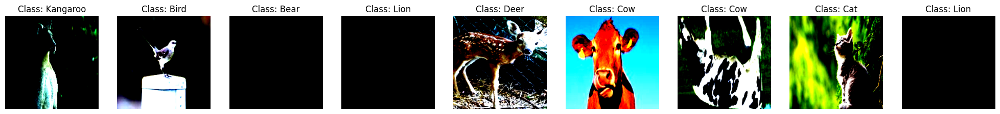

In [36]:
data_setup.display_random_images(data_dir = input_file,
                                 transforms=AlexNet_transform,
                                 fig_size = (25,15),
                                 n = 9,
                                 seed = 42,
                                 display_shape = False,
                                 permute = True)

###3.3.4 Choose a random image to test out model

In [37]:
img, label = next(iter(train_dataloader_AlexNet))

print(f"Image Shape : {img.shape} -> [batch_size, color_channel, height, width]")
print(f"Label shape: {label.shape}")

Image Shape : torch.Size([32, 3, 224, 224]) -> [batch_size, color_channel, height, width]
Label shape: torch.Size([32])


In [38]:
# Choose a ranodom numer
batch_size = train_dataloader_ResNet18.batch_size
random_samples_idx = random.randint(0, batch_size)
random_img = img[random_samples_idx].unsqueeze(dim=0).to(device)
random_label = label[random_samples_idx]
# Pass the random image tensor to our ResNet_50 instance
y_pred=resnet_18_model(random_img)
y_pred_class = torch.argmax(torch.softmax(y_pred, dim=1), dim=1)
print(f"The Actual class is :{class_names[random_label]} | The Predicted class is:{class_names[y_pred_class]}")
print(f"The Shape of the predicted class is {y_pred.shape}")

The Actual class is :Giraffe | The Predicted class is:Horse
The Shape of the predicted class is torch.Size([1, 15])


###3.3.5 Setup the model

In this section we are going to:
1.  Move the model and DataLoaders to device
2.  Build Loss function
3.  Build Optimizer Function

In [39]:
loss_fn_AlexNet = nn.CrossEntropyLoss()
optimizer_AlexNet = torch.optim.Adam(AlexNet_model.parameters())

##3.4 MobileNet

###3.4.1 MobileNet Preprocessing

In [40]:
set_seeds
MobileNet_model , MobileNet_transform = model_builder.create_MobileNet(number_of_classes=len(class_names),
                                                                      trainable = False,
                                                                      device = device)
models.append(MobileNet_model)

Downloading: "https://download.pytorch.org/models/mobilenet_v2-7ebf99e0.pth" to /root/.cache/torch/hub/checkpoints/mobilenet_v2-7ebf99e0.pth
100%|██████████| 13.6M/13.6M [00:00<00:00, 99.7MB/s]

[INFO] Created new MobileNet model.
[INFO] With classifier layer Sequential(
  (0): Dropout(p=0.2, inplace=False)
  (1): Linear(in_features=1280, out_features=15, bias=True)
)


In [41]:
MobileNet_transform

ImageClassification(
    crop_size=[224]
    resize_size=[232]
    mean=[0.485, 0.456, 0.406]
    std=[0.229, 0.224, 0.225]
    interpolation=InterpolationMode.BILINEAR
)

In [42]:
MobileNet_model.classifier

Sequential(
  (0): Dropout(p=0.2, inplace=False)
  (1): Linear(in_features=1280, out_features=15, bias=True)
)

###3.4.2 MobileNet Summary

In [43]:
summary(MobileNet_model,
        input_size=(32, 3, 224, 224), # make sure this is "input_size", not "input_shape" (batch_size, color_channels, height, width)
        verbose=0,
        col_names=["input_size", "output_size", "num_params", "trainable"],
        col_width=20,
        row_settings=["var_names"]
)

Layer (type (var_name))                       Input Shape          Output Shape         Param #              Trainable
MobileNetV2 (MobileNetV2)                     [32, 3, 224, 224]    [32, 15]             --                   Partial
├─Sequential (features)                       [32, 3, 224, 224]    [32, 1280, 7, 7]     --                   False
│    └─Conv2dNormActivation (0)               [32, 3, 224, 224]    [32, 32, 112, 112]   --                   False
│    │    └─Conv2d (0)                        [32, 3, 224, 224]    [32, 32, 112, 112]   (864)                False
│    │    └─BatchNorm2d (1)                   [32, 32, 112, 112]   [32, 32, 112, 112]   (64)                 False
│    │    └─ReLU6 (2)                         [32, 32, 112, 112]   [32, 32, 112, 112]   --                   --
│    └─InvertedResidual (1)                   [32, 32, 112, 112]   [32, 16, 112, 112]   --                   False
│    │    └─Sequential (conv)                 [32, 32, 112, 112]   [32, 16, 1

###3.4.3 MobileNet DataLoader

In [44]:
train_dataloader_MobileNet, val_dataloader_MobileNet, test_dataloader_MobileNet, class_names = data_setup.create_dataloaders(train_dir = train_data_path,
                                                                                                             test_dir = test_data_path,
                                                                                                             val_dir = val_data_path,
                                                                                                             train_transform = MobileNet_transform,
                                                                                                             val_transform = MobileNet_transform,
                                                                                                             test_transform = MobileNet_transform,
                                                                                                             batch_size = 32,
                                                                                                             num_workers = os.cpu_count())
train_dataloader.append(train_dataloader_MobileNet)
val_dataloader.append(val_dataloader_MobileNet)
test_dataloader.append(test_dataloader_MobileNet)

###3.4.4 Choose a random image to test our model


In [45]:
img, label = next(iter(train_dataloader_MobileNet))

print(f"Image Shape : {img.shape} -> [batch_size, color_channel, height, width]")
print(f"Label shape: {label.shape}")

Image Shape : torch.Size([32, 3, 224, 224]) -> [batch_size, color_channel, height, width]
Label shape: torch.Size([32])


In [46]:
# Choose a ranodom numer
batch_size = train_dataloader_ResNet18.batch_size
random_samples_idx = random.randint(0, batch_size)
random_img = img[random_samples_idx].unsqueeze(dim=0).to(device)
random_label = label[random_samples_idx]
# Pass the random image tensor to our ResNet_50 instance
y_pred=resnet_18_model(random_img)
y_pred_class = torch.argmax(torch.softmax(y_pred, dim=1), dim=1)
print(f"The Actual class is :{class_names[random_label]} | The Predicted class is:{class_names[y_pred_class]}")
print(f"The Shape of the predicted class is {y_pred.shape}")

The Actual class is :Lion | The Predicted class is:Horse
The Shape of the predicted class is torch.Size([1, 15])


###3.4.5 Setup the model

In this section we are going to:
1.  Move the model and DataLoaders to device
2.  Build Loss function
3.  Build Optimizer Function

In [47]:
loss_fn_MobileNet = nn.CrossEntropyLoss()
optimizer_MobileNet = torch.optim.Adam(MobileNet_model.parameters())

##3.5 EfficientNet_V2


### 3.5.1 EfficientNet_V2 Preprocessing


In [48]:
set_seeds
EfficientNet_V2_model , EfficientNet_V2_transform = model_builder.create_EfficientNet_V2(number_of_classes=len(class_names),
                                                                                         trainable = False,
                                                                                        device = device)
models.append(EfficientNet_V2_model)

Downloading: "https://download.pytorch.org/models/efficientnet_v2_l-59c71312.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_v2_l-59c71312.pth
100%|██████████| 455M/455M [00:05<00:00, 90.0MB/s]


[INFO] Created new EfficientNet_V2 model.
[INFO] With classifier layer Sequential(
  (0): Dropout(p=0.4, inplace=True)
  (1): Linear(in_features=1280, out_features=15, bias=True)
)


### 3.5.2 EfficientNet_V2 Summary


In [49]:
summary(EfficientNet_V2_model,
        input_size=(32, 3, 480, 480), # make sure this is "input_size", not "input_shape" (batch_size, color_channels, height, width)
        verbose=0,
        col_names=["input_size", "output_size", "num_params", "trainable"],
        col_width=20,
        row_settings=["var_names"]
)

Layer (type (var_name))                                      Input Shape          Output Shape         Param #              Trainable
EfficientNet (EfficientNet)                                  [32, 3, 480, 480]    [32, 15]             --                   Partial
├─Sequential (features)                                      [32, 3, 480, 480]    [32, 1280, 15, 15]   --                   False
│    └─Conv2dNormActivation (0)                              [32, 3, 480, 480]    [32, 32, 240, 240]   --                   False
│    │    └─Conv2d (0)                                       [32, 3, 480, 480]    [32, 32, 240, 240]   (864)                False
│    │    └─BatchNorm2d (1)                                  [32, 32, 240, 240]   [32, 32, 240, 240]   (64)                 False
│    │    └─SiLU (2)                                         [32, 32, 240, 240]   [32, 32, 240, 240]   --                   --
│    └─Sequential (1)                                        [32, 32, 240, 240]   [32, 

### 3.5.3 EfficientNet_V2 DataLoader


In [50]:
train_dataloader_EfficientNet_V2, val_dataloader_EfficientNet_V2, test_dataloader_EfficientNet_V2, class_names = data_setup.create_dataloaders(train_dir = train_data_path,
                                                                                                                                              test_dir = test_data_path,
                                                                                                                                              val_dir = val_data_path,
                                                                                                                                              train_transform = EfficientNet_V2_transform,
                                                                                                                                              val_transform = EfficientNet_V2_transform,
                                                                                                                                              test_transform = EfficientNet_V2_transform,
                                                                                                                                              batch_size = 32,
                                                                                                                                              num_workers = os.cpu_count())
train_dataloader.append(train_dataloader_EfficientNet_V2)
val_dataloader.append(val_dataloader_EfficientNet_V2)
test_dataloader.append(test_dataloader_EfficientNet_V2)

### 3.5.4 Choose a random image to test our model


In [51]:
img, label = next(iter(train_dataloader_EfficientNet_V2))

print(f"Image Shape : {img.shape} -> [batch_size, color_channel, height, width]")
print(f"Label shape: {label.shape}")

Image Shape : torch.Size([32, 3, 480, 480]) -> [batch_size, color_channel, height, width]
Label shape: torch.Size([32])


In [52]:
# Choose a ranodom numer
batch_size = train_dataloader_EfficientNet_V2.batch_size
random_samples_idx = random.randint(0, batch_size)
random_img = img[random_samples_idx].unsqueeze(dim=0).to(device)
random_label = label[random_samples_idx]
# Pass the random image tensor to our ResNet_50 instance
y_pred=EfficientNet_V2_model(random_img)
y_pred_class = torch.argmax(torch.softmax(y_pred, dim=1), dim=1)
# print(f"The Actual class is :{class_names[1]} | The Predicted class is:{class_names[y_pred_class]}")
print(f"The Shape of the predicted class is {y_pred.shape}")

The Shape of the predicted class is torch.Size([1, 15])


###3.5.5 Setup the model

In this section we are going to:
1.  Move the model and DataLoaders to device
2.  Build Loss function
3.  Build Optimizer Function

In [53]:
loss_fn_EfficientNet_V2 = nn.CrossEntropyLoss()
optimizer_EfficientNet_V2 = torch.optim.Adam(EfficientNet_V2_model.parameters())

In [54]:
# Train_time list to trace the training time of each model
Train_time = []
# Test_time list to trace the training time of each model
Test_time = []
# Train_loss list to trace the training loss of each model
Train_loss = []
# Test_loss list to trace the testing loss of each model
Test_loss = []
# val_loss list to trace the validating loss of each model
Val_loss = []
# val_loss list to trace the validating loss of each model
Val_acc = []
# Train_Acc list to trace the training accuracy of each model
Train_Acc = []
# Test_Acc list to trace the testing accuracy of each model
Test_Acc = []
# Total_Param list to trace the number of parameters of each model
Total_Param = []
# Total_Param list to trace the number of trainable parameters of each model
Trainable_Param = []
# Total_Param list to trace size of each model
Model_size = []

# **4. Train and evaluate  the model**

##4.1 ResNet Model

###4.1.1 Train ResNet50 Model

In [55]:
start_time = timer()

# Setup training and save the results
ResNet50_results = engine.train(model=resnet_50_model,
                       train_dataloader=train_dataloader_ResNet50,
                       val_dataloader=val_dataloader_ResNet50,
                       optimizer=optimizer_resnet_50_model,
                       loss_fn=loss_fun_resnet_50,
                       epochs=25,
                       device=device)

# End the timer and print out how long it took
end_time = timer()
time = end_time - start_time
train_time_resnet_50_model = str(time // 60)+"mins " + str(int(time % 60)) +"secs"
print(f"[INFO] Total training time: {train_time_resnet_50_model}")
Train_time.append(train_time_resnet_50_model)

in epoch: 1/25
Epoch: 1 | train_loss: 1.7267 | train_acc: 0.7131 | val_loss: 1.1283 | val_acc: 0.8527
in epoch: 2/25
Epoch: 2 | train_loss: 0.5884 | train_acc: 0.9659 | val_loss: 0.5497 | val_acc: 0.9286
in epoch: 3/25
Epoch: 3 | train_loss: 0.3106 | train_acc: 0.9821 | val_loss: 0.4066 | val_acc: 0.9196
in epoch: 4/25
Epoch: 4 | train_loss: 0.1969 | train_acc: 0.9882 | val_loss: 0.2545 | val_acc: 0.9777
in epoch: 5/25
Epoch: 5 | train_loss: 0.1445 | train_acc: 0.9911 | val_loss: 0.3021 | val_acc: 0.9420
in epoch: 6/25
Epoch: 6 | train_loss: 0.1097 | train_acc: 0.9930 | val_loss: 0.2681 | val_acc: 0.9241
in epoch: 7/25
Epoch: 7 | train_loss: 0.0976 | train_acc: 0.9918 | val_loss: 0.3081 | val_acc: 0.9330
in epoch: 8/25
Epoch: 8 | train_loss: 0.0672 | train_acc: 0.9981 | val_loss: 0.3402 | val_acc: 0.9241
in epoch: 9/25
Epoch: 9 | train_loss: 0.0638 | train_acc: 0.9968 | val_loss: 0.1434 | val_acc: 0.9777
in epoch: 10/25
Epoch: 10 | train_loss: 0.0455 | train_acc: 0.9994 | val_loss: 0.0

###4.1.2 Evaluate ResNet Model

In [56]:
start_time = timer()
test_loss, test_acc, conf_matrix, classification_rep = engine.evaluate(resnet_50_model, test_dataloader_ResNet50, loss_fun_resnet_50, device=device)
end_time = timer()
time = end_time - start_time
test_time_resnet_50_model = str(time // 60)+"mins " + str(int(time % 60)) +"secs"
print(f"[INFO] Total Testing time: {test_time_resnet_50_model}")
Test_time.append(test_time_resnet_50_model)
Test_Acc.append(test_acc)
Test_loss.append(test_loss)
# Update The Expiremental Lists
Train_loss.append(ResNet50_results['train_loss'][-1])
Train_Acc.append(ResNet50_results['train_acc'][-1])
Val_acc.append(ResNet50_results['val_acc'][-1])
Val_loss.append(ResNet50_results['val_loss'][-1])
print("confolution Matrix: ")
print(conf_matrix)
print("Classification Report: ")
print(classification_rep)

Model_Name: ResNet_50
Test loss: 0.6533808028325438 | Test accuracy:97.11538461538461%
[INFO] Total Testing time: 0.0mins 2secs
confolution Matrix: 
[[13  0  0  0  0  0  0  0  0  0  0  0  0  0  0]
 [ 0 15  0  0  0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0 12  1  0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0 13  1  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0 13  0  0  0  0  0  1  0  0  0  0]
 [ 0  0  0  0  0 13  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0 14  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  1 13  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0 14  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0 13  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0 14  0  0  0  0]
 [ 0  0  0  0  1  0  0  0  0  1  0 12  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0  0 14  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0  0  0 14  0]
 [ 0  0  0  0  0  0  0  0  0  0  0  0  0  0 15]]
Classification Report: 
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        

###4.1.3 Plot Curve

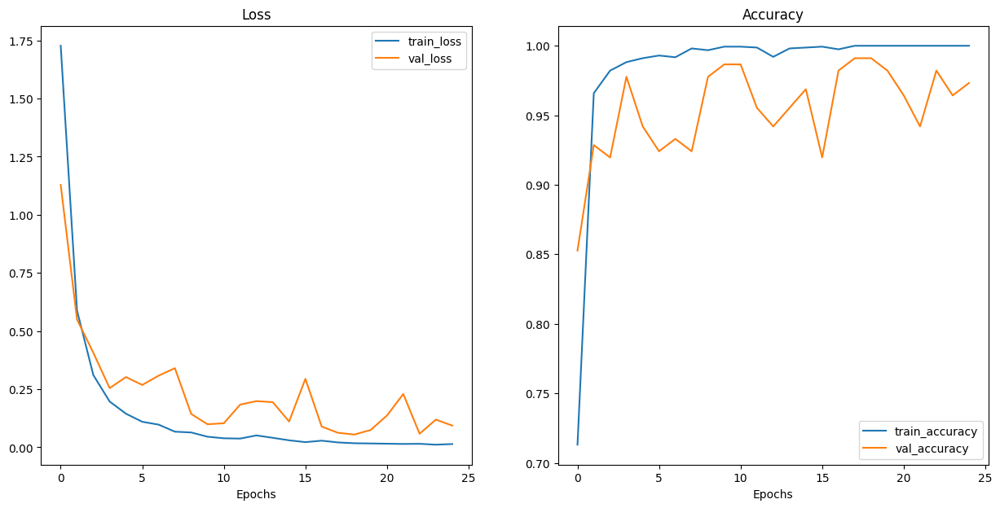

In [57]:
plot_loss_curves(results= ResNet50_results,
                 model_name = resnet_50_model.name,
                 save_file = True,
                 root_dir = metric_path)

###4.1.4  Save the model

In [58]:
utils.save_model(model = resnet_50_model,
                 target_dir =model_path,
                 model_name = "ResNet_50.pth")

[INFO] Saving model to: /content/drive/MyDrive/Machine&Deep_LearningProjects/02-Animal_Classifications/going_modular/models/ResNet_50.pth


##4.2 ResNet_18 Model

###4.2.1 Train ResNet18 Model

In [59]:
from timeit import default_timer as timer
start_time = timer()

# Setup training and save the results
ResNet18_results = engine.train(model=resnet_18_model,
                       train_dataloader=train_dataloader_ResNet18,
                       val_dataloader=val_dataloader_ResNet18,
                       optimizer=optimizer_resnet_18_model,
                       loss_fn=loss_fun_resnet_50,
                       epochs=25,
                       device=device)

# End the timer and print out how long it took
end_time = timer()
time = end_time - start_time
train_time_resnet_18_model = str(time // 60)+"mins " + str(int(time % 60)) +"secs"
print(f"[INFO] Total training time: {train_time_resnet_18_model}")
Train_time.append(train_time_resnet_18_model)

in epoch: 1/25
Epoch: 1 | train_loss: 1.8144 | train_acc: 0.5230 | val_loss: 1.0490 | val_acc: 0.8080
in epoch: 2/25
Epoch: 2 | train_loss: 0.6969 | train_acc: 0.9060 | val_loss: 0.6149 | val_acc: 0.8795
in epoch: 3/25
Epoch: 3 | train_loss: 0.4300 | train_acc: 0.9458 | val_loss: 0.4331 | val_acc: 0.9152
in epoch: 4/25
Epoch: 4 | train_loss: 0.3249 | train_acc: 0.9534 | val_loss: 0.4116 | val_acc: 0.9018
in epoch: 5/25
Epoch: 5 | train_loss: 0.2492 | train_acc: 0.9649 | val_loss: 0.3996 | val_acc: 0.9152
in epoch: 6/25
Epoch: 6 | train_loss: 0.2096 | train_acc: 0.9745 | val_loss: 0.2841 | val_acc: 0.9464
in epoch: 7/25
Epoch: 7 | train_loss: 0.1739 | train_acc: 0.9790 | val_loss: 0.2907 | val_acc: 0.9509
in epoch: 8/25
Epoch: 8 | train_loss: 0.1483 | train_acc: 0.9821 | val_loss: 0.3488 | val_acc: 0.9196
in epoch: 9/25
Epoch: 9 | train_loss: 0.1374 | train_acc: 0.9783 | val_loss: 0.2294 | val_acc: 0.9330
in epoch: 10/25
Epoch: 10 | train_loss: 0.1267 | train_acc: 0.9783 | val_loss: 0.2

###4.2.2 Evaluate ResNet18 Model

In [60]:
start_time = timer()
test_loss, test_acc, conf_matrix, classification_rep = engine.evaluate(resnet_18_model, test_dataloader_ResNet18, loss_fun_resnet_18, device=device)
end_time = timer()
time = end_time - start_time
test_time_resnet_18_model = str(time // 60)+"mins " + str(int(time % 60)) +"secs"
print(f"[INFO] Total Testing time: {test_time_resnet_18_model}")
# Update The Expiremental Lists
Test_time.append(test_time_resnet_18_model)
Test_Acc.append(test_acc)
Test_loss.append(test_loss)
Train_loss.append(ResNet18_results['train_loss'][-1])
Train_Acc.append(ResNet18_results['train_acc'][-1])
Val_acc.append(ResNet18_results['val_acc'][-1])
Val_loss.append(ResNet18_results['val_loss'][-1])
print("confolution Matrix: ")
print(conf_matrix)
print("Classification Report: ")
print(classification_rep)

Model_Name: ResNet_18
Test loss: 2.037545870989561 | Test accuracy:92.3076923076923%
[INFO] Total Testing time: 0.0mins 2secs
confolution Matrix: 
[[ 9  0  0  0  0  2  0  1  0  0  0  0  1  0  0]
 [ 0 14  0  0  0  0  1  0  0  0  0  0  0  0  0]
 [ 0  0 13  0  0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0 11  2  0  0  0  1  0  0  0  0  0  0]
 [ 0  0  0  0 14  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0 12  0  0  0  0  0  1  0  0  0]
 [ 0  0  0  0  1  0 13  0  0  0  0  0  0  0  0]
 [ 0  0  0  1  0  0  1 12  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0 14  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  1  0  0 12  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0 14  0  0  0  0]
 [ 0  0  0  0  1  0  0  0  0  0  1 12  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0  0 14  0  0]
 [ 0  0  0  0  0  0  0  0  0  1  0  0  0 13  0]
 [ 0  0  0  0  0  0  0  0  0  0  0  0  0  0 15]]
Classification Report: 
              precision    recall  f1-score   support

           0       1.00      0.69      0.82        13

###4.2.3 Plot Curves

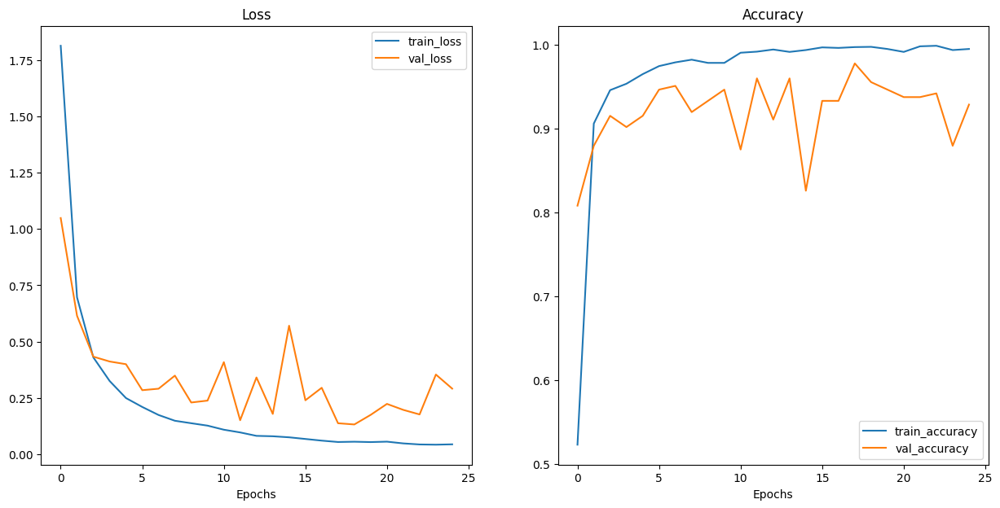

In [61]:
plot_loss_curves(results= ResNet18_results,
                 model_name = resnet_18_model.name,
                 save_file = True,
                 root_dir = metric_path)

###4.2.4 Save the model

In [62]:
utils.save_model(model = resnet_18_model,
                 target_dir =model_path,
                 model_name = "ResNet_18.pth")

[INFO] Saving model to: /content/drive/MyDrive/Machine&Deep_LearningProjects/02-Animal_Classifications/going_modular/models/ResNet_18.pth


##4.3 AlexNet Model

####4.3.1 Train AlexNet Model

In [63]:
from timeit import default_timer as timer
start_time = timer()

# Setup training and save the results
AlexNet_results = engine.train(model=AlexNet_model,
                       train_dataloader=train_dataloader_AlexNet,
                       val_dataloader=val_dataloader_AlexNet,
                       optimizer=optimizer_AlexNet,
                       loss_fn=loss_fn_AlexNet,
                       epochs=25,
                       device=device)

# End the timer and print out how long it took
end_time = timer()
time = end_time - start_time
train_time_AlexNet_model = str(time // 60)+"mins " + str(int(time % 60)) +"secs"
print(f"[INFO] Total training time: {train_time_AlexNet_model}")
Train_time.append(train_time_AlexNet_model)

in epoch: 1/25
Epoch: 1 | train_loss: 2.4781 | train_acc: 0.5055 | val_loss: 0.5840 | val_acc: 0.8125
in epoch: 2/25
Epoch: 2 | train_loss: 0.6607 | train_acc: 0.8138 | val_loss: 0.5680 | val_acc: 0.8259
in epoch: 3/25
Epoch: 3 | train_loss: 0.4814 | train_acc: 0.8591 | val_loss: 0.4942 | val_acc: 0.8571
in epoch: 4/25
Epoch: 4 | train_loss: 0.4172 | train_acc: 0.8923 | val_loss: 0.5520 | val_acc: 0.8393
in epoch: 5/25
Epoch: 5 | train_loss: 0.3528 | train_acc: 0.9021 | val_loss: 0.4641 | val_acc: 0.8527
in epoch: 6/25
Epoch: 6 | train_loss: 0.3824 | train_acc: 0.9066 | val_loss: 0.6670 | val_acc: 0.8393
in epoch: 7/25
Epoch: 7 | train_loss: 0.3816 | train_acc: 0.9120 | val_loss: 0.5084 | val_acc: 0.8527
in epoch: 8/25
Epoch: 8 | train_loss: 0.3278 | train_acc: 0.9222 | val_loss: 0.4949 | val_acc: 0.8839
in epoch: 9/25
Epoch: 9 | train_loss: 0.3477 | train_acc: 0.9305 | val_loss: 0.5352 | val_acc: 0.8973
in epoch: 10/25
Epoch: 10 | train_loss: 0.3569 | train_acc: 0.9200 | val_loss: 0.4

###4.3.2 Evaluate AlexNet Model

In [64]:
start_time = timer()
test_loss, test_acc, conf_matrix, classification_rep = engine.evaluate(AlexNet_model, test_dataloader_AlexNet, loss_fn_AlexNet, device=device)
end_time = timer()
time = end_time - start_time
test_time_AlexNet_model = str(time // 60)+"mins " + str(int(time % 60)) +"secs"
print(f"[INFO] Total Testing time: {test_time_AlexNet_model}")
# Update The Expiremental Lists
Test_time.append(test_time_AlexNet_model)
Test_Acc.append(test_acc)
Test_loss.append(test_loss)
Train_loss.append(AlexNet_results['train_loss'][-1])
Train_Acc.append(AlexNet_results['train_acc'][-1])
Val_acc.append(AlexNet_results['val_acc'][-1])
Val_loss.append(AlexNet_results['val_loss'][-1])
print("confolution Matrix: ")
print(conf_matrix)
print("Classification Report: ")
print(classification_rep)

Model_Name: AlexNet
Test loss: 3.0833131670951843 | Test accuracy:91.34615384615384%
[INFO] Total Testing time: 0.0mins 1secs
confolution Matrix: 
[[13  0  0  0  0  0  0  0  0  0  0  0  0  0  0]
 [ 0 13  0  0  0  0  1  0  0  0  0  0  1  0  0]
 [ 0  0 13  0  0  0  0  0  0  0  0  0  0  0  0]
 [ 1  0  0 10  1  1  0  0  0  1  0  0  0  0  0]
 [ 0  0  0  0 12  0  0  0  0  1  1  0  0  0  0]
 [ 0  0  0  1  0 12  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0 14  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0 12  1  0  1  0  0  0  0]
 [ 0  0  0  0  0  0  0  0 14  0  0  0  0  0  0]
 [ 1  0  0  0  0  0  2  1  0  9  0  0  0  0  0]
 [ 0  0  0  0  0  0  1  0  0  0 13  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  1 13  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0  0 14  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  1  0  0 13  0]
 [ 0  0  0  0  0  0  0  0  0  0  0  0  0  0 15]]
Classification Report: 
              precision    recall  f1-score   support

           0       0.87      1.00      0.93        13

###4.3.3 Plot Curves

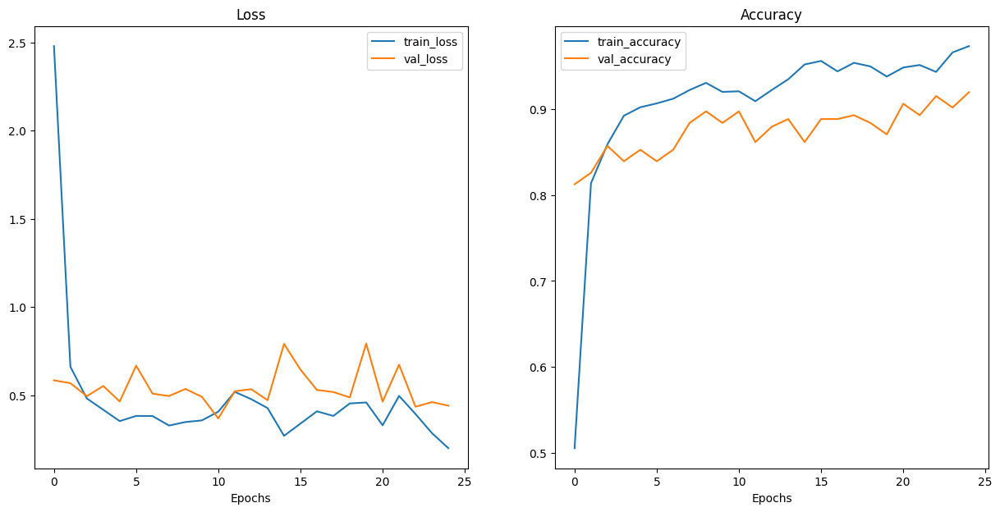

In [65]:
plot_loss_curves(results= AlexNet_results,
                 model_name = AlexNet_model.name,
                 save_file = True,
                 root_dir = metric_path)

###4.3.4 Save the model

In [66]:
utils.save_model(model = AlexNet_model,
                 target_dir =model_path,
                 model_name = "AlexNet.pth")

[INFO] Saving model to: /content/drive/MyDrive/Machine&Deep_LearningProjects/02-Animal_Classifications/going_modular/models/AlexNet.pth


##4.4 MobileNet Model

###4.4.1 Train MobileNet Model

In [67]:
from timeit import default_timer as timer
start_time = timer()

# Setup training and save the results
MobileNet_results = engine.train(model=MobileNet_model,
                                train_dataloader=train_dataloader_MobileNet,
                                val_dataloader=val_dataloader_MobileNet,
                                optimizer=optimizer_MobileNet,
                                loss_fn=loss_fn_MobileNet,
                                epochs=50,
                                device=device)

# End the timer and print out how long it took
end_time = timer()
time = end_time - start_time
train_time_MobileNet_model = str(time // 60)+"mins " + str(int(time % 60)) +"secs"
print(f"[INFO] Total training time: {train_time_MobileNet_model}")
Train_time.append(train_time_MobileNet_model)

in epoch: 1/50
Epoch: 1 | train_loss: 1.8853 | train_acc: 0.6535 | val_loss: 1.1310 | val_acc: 0.9196
in epoch: 2/50
Epoch: 2 | train_loss: 0.8275 | train_acc: 0.9324 | val_loss: 0.6238 | val_acc: 0.9554
in epoch: 3/50
Epoch: 3 | train_loss: 0.4970 | train_acc: 0.9579 | val_loss: 0.4468 | val_acc: 0.9554
in epoch: 4/50
Epoch: 4 | train_loss: 0.3660 | train_acc: 0.9653 | val_loss: 0.3409 | val_acc: 0.9643
in epoch: 5/50
Epoch: 5 | train_loss: 0.2941 | train_acc: 0.9675 | val_loss: 0.2798 | val_acc: 0.9688
in epoch: 6/50
Epoch: 6 | train_loss: 0.2429 | train_acc: 0.9732 | val_loss: 0.2297 | val_acc: 0.9821
in epoch: 7/50
Epoch: 7 | train_loss: 0.2048 | train_acc: 0.9815 | val_loss: 0.2060 | val_acc: 0.9777
in epoch: 8/50
Epoch: 8 | train_loss: 0.1766 | train_acc: 0.9815 | val_loss: 0.1865 | val_acc: 0.9777
in epoch: 9/50
Epoch: 9 | train_loss: 0.1545 | train_acc: 0.9850 | val_loss: 0.1794 | val_acc: 0.9777
in epoch: 10/50
Epoch: 10 | train_loss: 0.1446 | train_acc: 0.9857 | val_loss: 0.1

###4.4.2  Evaluate MobileNet model

In [68]:
start_time = timer()
test_loss, test_acc, conf_matrix, classification_rep = engine.evaluate(MobileNet_model, test_dataloader_MobileNet, loss_fn_MobileNet, device=device)
end_time = timer()
time = end_time - start_time
test_time_MobileNet_model = str(time // 60)+"mins " + str(int(time % 60)) +"secs"
print(f"[INFO] Total Testing time: {test_time_MobileNet_model}")
# Update The Expiremental Lists
Test_time.append(test_time_MobileNet_model)
Test_Acc.append(test_acc)
Test_loss.append(test_loss)
Train_loss.append(MobileNet_results['train_loss'][-1])
Train_Acc.append(MobileNet_results['train_acc'][-1])
Val_acc.append(MobileNet_results['val_acc'][-1])
Val_loss.append(MobileNet_results['val_loss'][-1])
print("confolution Matrix: ")
print(conf_matrix)
print("Classification Report: ")
print(classification_rep)

Model_Name: MobileNet
Test loss: 0.4054072955623269 | Test accuracy:98.5576923076923%
[INFO] Total Testing time: 0.0mins 1secs
confolution Matrix: 
[[13  0  0  0  0  0  0  0  0  0  0  0  0  0  0]
 [ 0 15  0  0  0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0 12  0  0  0  0  1  0  0  0  0  0  0  0]
 [ 0  1  0 13  0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0 14  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0 13  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0 14  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0 14  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0 14  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0 13  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0 14  0  0  0  0]
 [ 0  0  0  0  1  0  0  0  0  0  0 13  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0  0 14  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0  0  0 14  0]
 [ 0  0  0  0  0  0  0  0  0  0  0  0  0  0 15]]
Classification Report: 
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        1

###4.4.3  Plot Curves

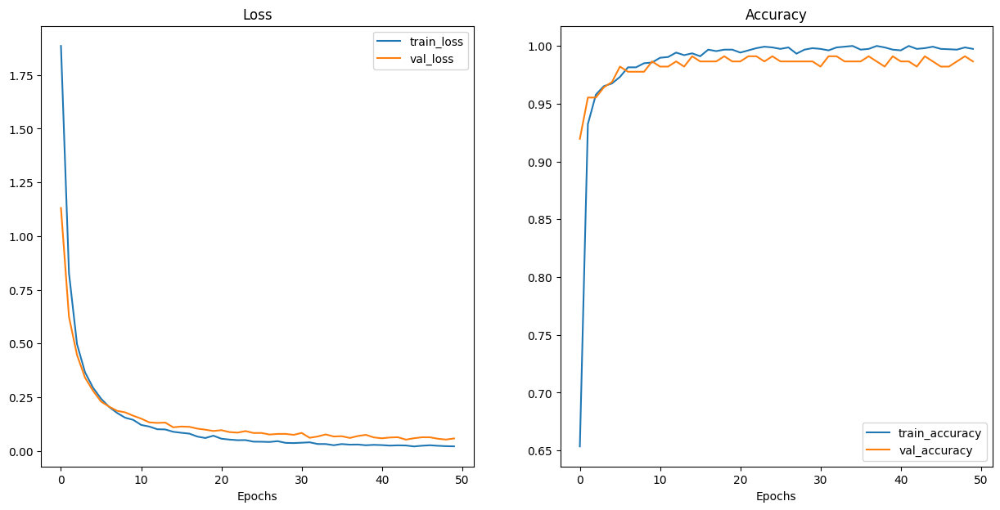

In [69]:
plot_loss_curves(results= MobileNet_results,
                 model_name = MobileNet_model.name,
                 save_file = True,
                 root_dir = metric_path)

###4.4.4 Save the model

In [70]:
utils.save_model(model = MobileNet_model,
                 target_dir =model_path,
                 model_name = "MobileNet.pth")

[INFO] Saving model to: /content/drive/MyDrive/Machine&Deep_LearningProjects/02-Animal_Classifications/going_modular/models/MobileNet.pth


##4.5 EfficientNet_V2 Model

###4.5.1 Train EfficientNet_V2 Model

In [71]:
from timeit import default_timer as timer
start_time = timer()

# Setup training and save the results
EfficientNet_V2_results = engine.train(model=EfficientNet_V2_model,
                                      train_dataloader=train_dataloader_EfficientNet_V2,
                                      val_dataloader=val_dataloader_EfficientNet_V2,
                                      optimizer=optimizer_EfficientNet_V2,
                                      loss_fn=loss_fn_EfficientNet_V2,
                                      epochs=15,
                                      device=device)

# End the timer and print out how long it took
end_time = timer()
time = end_time - start_time
train_time_resnet_50_model = str(time // 60)+"mins " + str(int(time % 60)) +"secs"
print(f"[INFO] Total training time: {train_time_resnet_50_model}")
Train_time.append(train_time_resnet_50_model)

in epoch: 1/15
Epoch: 1 | train_loss: 1.6628 | train_acc: 0.6126 | val_loss: 0.7395 | val_acc: 0.9554
in epoch: 2/15
Epoch: 2 | train_loss: 0.5691 | train_acc: 0.9245 | val_loss: 0.3543 | val_acc: 0.9866
in epoch: 3/15
Epoch: 3 | train_loss: 0.3622 | train_acc: 0.9458 | val_loss: 0.2474 | val_acc: 0.9911
in epoch: 4/15
Epoch: 4 | train_loss: 0.2450 | train_acc: 0.9621 | val_loss: 0.1652 | val_acc: 1.0000
in epoch: 5/15
Epoch: 5 | train_loss: 0.1862 | train_acc: 0.9758 | val_loss: 0.1411 | val_acc: 0.9955
in epoch: 6/15
Epoch: 6 | train_loss: 0.1662 | train_acc: 0.9726 | val_loss: 0.1198 | val_acc: 0.9955
in epoch: 7/15
Epoch: 7 | train_loss: 0.1444 | train_acc: 0.9783 | val_loss: 0.1083 | val_acc: 0.9911
in epoch: 8/15
Epoch: 8 | train_loss: 0.1220 | train_acc: 0.9815 | val_loss: 0.0983 | val_acc: 0.9866
in epoch: 9/15
Epoch: 9 | train_loss: 0.1082 | train_acc: 0.9850 | val_loss: 0.0787 | val_acc: 0.9955
in epoch: 10/15
Epoch: 10 | train_loss: 0.1102 | train_acc: 0.9818 | val_loss: 0.0

###4.5.2 Evaluate EfficientNet_V2 Model

In [72]:
tart_time = timer()
test_loss, test_acc, conf_matrix, classification_rep= engine.evaluate(EfficientNet_V2_model, test_dataloader_EfficientNet_V2, loss_fn_EfficientNet_V2, device=device)
end_time = timer()
time = end_time - start_time
test_time_EfficientNet_V2_model = str(time // 60)+"mins " + str(int(time % 60)) +"secs"
print(f"[INFO] Total Testing time: {test_time_MobileNet_model}")
# Update The Expiremental Lists
Test_time.append(test_time_EfficientNet_V2_model)
Test_Acc.append(test_acc)
Test_loss.append(test_loss)
Train_loss.append(EfficientNet_V2_results['train_loss'][-1])
Train_Acc.append(EfficientNet_V2_results['train_acc'][-1])
Val_acc.append(EfficientNet_V2_results['val_acc'][-1])
Val_loss.append(EfficientNet_V2_results['val_loss'][-1])
print("confolution Matrix: ")
print(conf_matrix)
print("Classification Report: ")
print(classification_rep)

Model_Name: EfficientNet_V2
Test loss: 0.3934550639241934 | Test accuracy:98.5576923076923%
[INFO] Total Testing time: 0.0mins 1secs
confolution Matrix: 
[[13  0  0  0  0  0  0  0  0  0  0  0  0  0  0]
 [ 0 15  0  0  0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0 13  0  0  0  0  0  0  0  0  0  0  0  0]
 [ 1  0  0 13  0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0 14  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0 13  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0 14  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0 14  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0 14  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  1  0 12  0  0  0  0  0]
 [ 1  0  0  0  0  0  0  0  0  0 13  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0 14  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0  0 14  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0  0  0 14  0]
 [ 0  0  0  0  0  0  0  0  0  0  0  0  0  0 15]]
Classification Report: 
              precision    recall  f1-score   support

           0       0.87      1.00      0.93   

###4.5.3  Plot Curves

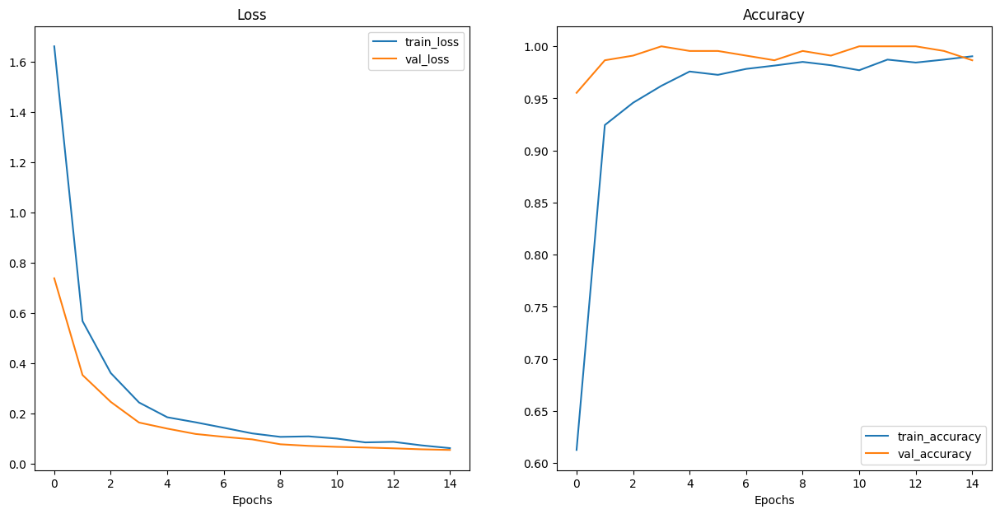

In [73]:
plot_loss_curves(results= EfficientNet_V2_results,
                 model_name = EfficientNet_V2_model.name,
                 save_file = True,
                 root_dir = metric_path)

###4.5.4  Save the model

In [74]:
utils.save_model(model = EfficientNet_V2_model,
                 target_dir =model_path,
                 model_name = "EfficientNet_v2.pth")

[INFO] Saving model to: /content/drive/MyDrive/Machine&Deep_LearningProjects/02-Animal_Classifications/going_modular/models/EfficientNet_v2.pth


# **5.  Experiment Tracking**

##5.1  Experiment Tracking using Excel

In [75]:
model_name = []
for model in models:
  model_name.append(model.name)
Data = {"Model_Name":model_name,
        "Train_Loss":Train_loss,
        "Train_Acc":Train_Acc,
        "Val_Acc":Val_acc,
        "Val_Loss":Val_loss,
        "Test_Loss":Test_loss,
        "Test_Acc":Test_Acc,
        "Train_Time":Train_time,
        "Test_Time":Test_time}

In [76]:
# Calling DataFrame constructor
df = pd.DataFrame()

# Create DataFrame
df = pd.DataFrame(Data)
#Save the excel file
df.to_csv('Expirement Tracking.csv')

In [77]:
df.head()

,Model_Name,Train_Loss,Train_Acc,Val_Acc,Val_Loss,Test_Loss,Test_Acc,Train_Time,Test_Time
0,ResNet_50,0.014003,1.000000,0.973214,0.093340,0.653381,97.115385,7.0mins 56secs,0.0mins 2secs
1,ResNet_18,0.043586,0.994898,0.928571,0.291078,2.037546,92.307692,4.0mins 52secs,0.0mins 2secs
2,AlexNet,0.199469,0.973214,0.919643,0.440473,3.083313,91.346154,4.0mins 40secs,0.0mins 1secs
3,MobileNet,0.021100,0.997449,0.986607,0.057915,0.405407,98.557692,9.0mins 8secs,0.0mins 1secs
4,EfficientNet_V2,0.063397,0.990434,0.986607,0.056208,0.393455,98.557692,21.0mins 44secs,21.0mins 55secs


##5.1  Experiment Tracking using TenserBoard

In [78]:
from torch.utils.tensorboard import SummaryWriter

def create_writer(experiment_name: str,
                  model_name: str,
                  extra: str=None) -> torch.utils.tensorboard.writer.SummaryWriter():
    """Creates a torch.utils.tensorboard.writer.SummaryWriter() instance saving to a specific log_dir.

    log_dir is a combination of runs/timestamp/experiment_name/model_name/extra.

    Where timestamp is the current date in YYYY-MM-DD format.

    Args:
        experiment_name (str): Name of experiment.
        model_name (str): Name of model.
        extra (str, optional): Anything extra to add to the directory. Defaults to None.

    Returns:
        torch.utils.tensorboard.writer.SummaryWriter(): Instance of a writer saving to log_dir.

    Example usage:
        # Create a writer saving to "runs/2022-06-04/data_10_percent/effnetb2/5_epochs/"
        writer = create_writer(experiment_name="data_10_percent",
                               model_name="effnetb2",
                               extra="5_epochs")
        # The above is the same as:
        writer = SummaryWriter(log_dir="runs/2022-06-04/data_10_percent/effnetb2/5_epochs/")
    """
    from datetime import datetime
    import os

    # Get timestamp of current date (all experiments on certain day live in same folder)
    timestamp = datetime.now().strftime("%Y-%m-%d") # returns current date in YYYY-MM-DD format

    if extra:
        # Create log directory path
        log_dir = os.path.join("runs", timestamp, experiment_name, model_name, extra)
    else:
        log_dir = os.path.join("runs", timestamp, experiment_name, model_name)

    print(f"[INFO] Created SummaryWriter, saving to: {log_dir}...")
    return SummaryWriter(log_dir=log_dir)

In [ ]:
# 1. Set the random seeds
set_seeds(seed=42)

# 2. Keep track of experiment numbers
experiment_number = 0
epochs = 10
# 3. Loop through each model name and create a new model based on the name
for model in models:
    start_time = timer()
    # 4. Create information print outs
    print(f"[INFO] Experiment number: {experiment_number+1} | Model_Name: {model.name} | Number of epochs: {epochs}")
    # 5. Create a new loss and optimizer for every model
    loss_fn = nn.CrossEntropyLoss()
    optimizer = torch.optim.Adam(params=model.parameters(), lr=0.001)
    train_data=train_dataloader[experiment_number],
    test_data=test_dataloader[experiment_number]
    print("[INFO] Start Training")
    # 6. Train target model with target dataloaders and track experiments
    engine.train(model=model,
          train_dataloader=train_dataloader[experiment_number],
          val_dataloader=test_dataloader[experiment_number],
          optimizer=optimizer,
          loss_fn=loss_fn,
          epochs=epochs,
          device=device,
          writer=create_writer(experiment_name="Animal_Data",
                                model_name=model.name))
    end_time = timer()
    time = end_time - start_time
    train_time = str(time // 60)+"mins " + str(int(time % 60)) +"secs"
    experiment_number += 1
    # 7. Save the model to file so we can get back the best model
    save_filepath = f"09_{model.name}_{epochs}_epochs.pth"
    utils.save_model(model=model,
                target_dir="models",
                model_name=save_filepath)
    print(f"[INFO] Training Time {model.name}: {train_time}")
    print("-"*50 + "\n")

[INFO] Experiment number: 1 | Model_Name: ResNet_50 | Number of epochs: 10
[INFO] Start Training
[INFO] Created SummaryWriter, saving to: runs/2024-05-19/Animal_Data/ResNet_50...
in epoch: 1/10
Epoch: 1 | train_loss: 0.0136 | train_acc: 0.9994 | val_loss: 0.1585 | val_acc: 0.9464
in epoch: 2/10
Epoch: 2 | train_loss: 0.0102 | train_acc: 0.9994 | val_loss: 0.2139 | val_acc: 0.9286
in epoch: 3/10
Epoch: 3 | train_loss: 0.0092 | train_acc: 0.9987 | val_loss: 0.2989 | val_acc: 0.9107
in epoch: 4/10
Epoch: 4 | train_loss: 0.0124 | train_acc: 0.9987 | val_loss: 0.2338 | val_acc: 0.9330
in epoch: 5/10
Epoch: 5 | train_loss: 0.0247 | train_acc: 0.9952 | val_loss: 0.3451 | val_acc: 0.9018
in epoch: 6/10
Epoch: 6 | train_loss: 0.0269 | train_acc: 0.9949 | val_loss: 0.2844 | val_acc: 0.9107
in epoch: 7/10
Epoch: 7 | train_loss: 0.0175 | train_acc: 0.9987 | val_loss: 0.0465 | val_acc: 0.9821
in epoch: 8/10
Epoch: 8 | train_loss: 0.0114 | train_acc: 0.9987 | val_loss: 0.0783 | val_acc: 0.9821
in ep

In [ ]:
# Viewing TensorBoard in Jupyter and Google Colab Notebooks
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

# **6 Load Best Model**

In [8]:
best_model , best_transform = model_builder.create_MobileNet(number_of_classes=15,
                                                                        trainable = False,
                                                                      device = device)

Downloading: "https://download.pytorch.org/models/mobilenet_v2-7ebf99e0.pth" to /root/.cache/torch/hub/checkpoints/mobilenet_v2-7ebf99e0.pth
100%|██████████| 13.6M/13.6M [00:00<00:00, 47.6MB/s]


[INFO] Created new MobileNet model.
[INFO] With classifier layer Sequential(
  (0): Dropout(p=0.2, inplace=False)
  (1): Linear(in_features=1280, out_features=15, bias=True)
)


In [9]:
weights_path = "/content/drive/MyDrive/Machine&Deep_LearningProjects/02-Animal_Classifications/going_modular/models/MobileNet.pth"
best_model.load_state_dict(torch.load(weights_path,map_location=torch.device(device)))

<All keys matched successfully>

## 6.1 Evaluate the loaded model

In [10]:
train_dataloader_MobileNet, val_dataloader_MobileNet, test_dataloader_MobileNet, class_names = data_setup.create_dataloaders(train_dir = train_data_path,
                                                                                                             test_dir = test_data_path,
                                                                                                             val_dir = val_data_path,
                                                                                                             train_transform = best_transform,
                                                                                                             val_transform = best_transform,
                                                                                                             test_transform = best_transform,
                                                                                                             batch_size = 32,
                                                                                                             num_workers = os.cpu_count())

In [11]:
loss_fn = nn.CrossEntropyLoss()
start_time = timer()
test_loss, test_acc, conf_matrix, classification_rep = engine.evaluate(best_model, test_dataloader_MobileNet, loss_fn, device=device)
end_time = timer()
time = end_time - start_time
test_time_MobileNet_model = str(time // 60)+"mins " + str(int(time % 60)) +"secs"
print(f"[INFO] Total Testing time: {test_time_MobileNet_model}")
# Update The Expiremental Lists
print("confolution Matrix: ")
print(conf_matrix)
print("Classification Report: ")
print(classification_rep)

Model_Name: MobileNet
Test loss: 0.40540942177176476 | Test accuracy:98.5576923076923%
[INFO] Total Testing time: 0.0mins 29secs
confolution Matrix: 
[[13  0  0  0  0  0  0  0  0  0  0  0  0  0  0]
 [ 0 15  0  0  0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0 12  0  0  0  0  1  0  0  0  0  0  0  0]
 [ 0  1  0 13  0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0 14  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0 13  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0 14  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0 14  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0 14  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0 13  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0 14  0  0  0  0]
 [ 0  0  0  0  1  0  0  0  0  0  0 13  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0  0 14  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0  0  0 14  0]
 [ 0  0  0  0  0  0  0  0  0  0  0  0  0  0 15]]
Classification Report: 
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       

##  6.2 Pred ana Plot Custom images

In [12]:
from typing import List, Tuple

from PIL import Image

from torchvision import transforms

# 1. Take in a trained model...
def pred_and_plot_image(model: torch.nn.Module,
                        image_path: str,
                        class_names: List[str],
                        image_size: Tuple[int, int] = (224, 224),
                        transform: torchvision.transforms = None,
                        device: torch.device=device):
  # 2. Open the image with PIL
  img = Image.open(image_path)

  # 3. Create a transform if one doesn't exist
  if transform is not None:
    image_transform = transform
  else:
    image_transform = transforms.Compose([
                                          transforms.Resize(image_size),
                                          transforms.ToTensor(),
                                          transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                                               std=[0.229, 0.224, 0.225])
    ])

  ### Predict on image ###
  # 4. Make sure the model is on the target device
  model.to(device)

  # 5. Turn on inference mode and eval mode
  model.eval()
  with torch.inference_mode():
    # 6. Transform the image and add an extra batch dimension
    transformed_image = image_transform(img).unsqueeze(dim=0) # [batch_size, color_channels, height, width]

    # 7. Make a prediction on the transformed image by passing it to the model (also ensure it's on the target device)
    target_image_pred = model(transformed_image.to(device))

  # 8. Convert the model's output logits to pred probs
  target_image_pred_probs = torch.softmax(target_image_pred, dim=1)
  # print(target_image_pred_probs.max())

  # 9. Convert the model's pred probs to pred labels
  target_image_pred_label = torch.argmax(target_image_pred_probs, dim=1)

  # 10. Plot image with predicted label and probability
  plt.figure()
  plt.imshow(img)
  plt.title(f"Pred: {class_names[target_image_pred_label]} | Prob: {target_image_pred_probs.max():.3f}")
  plt.axis(False);

In [13]:
Custom_image_path = "/content/drive/MyDrive/Machine&Deep_LearningProjects/02-Animal_Classifications/going_modular/Custom_Data"

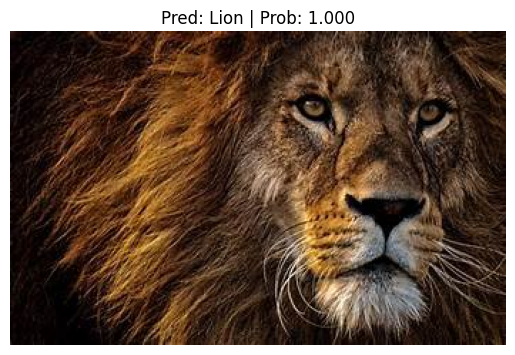

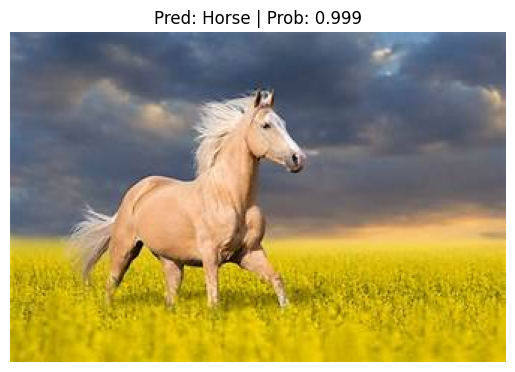

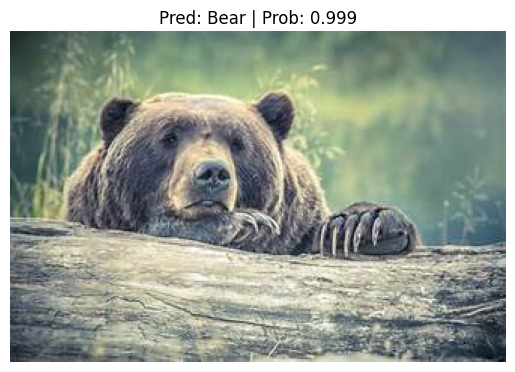

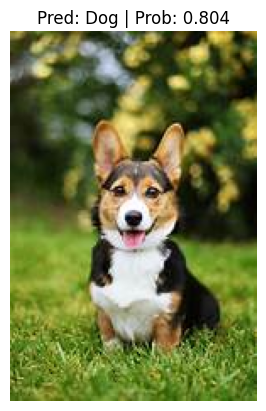

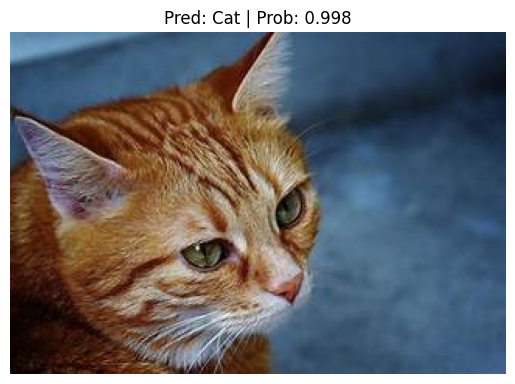

...

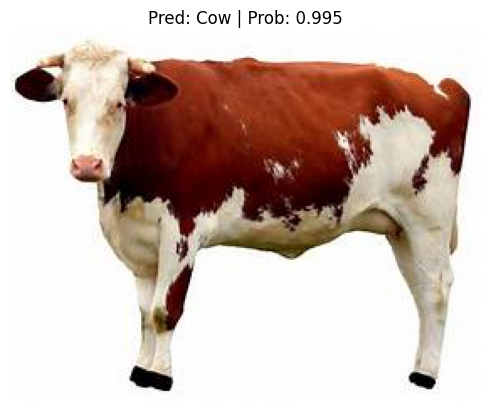

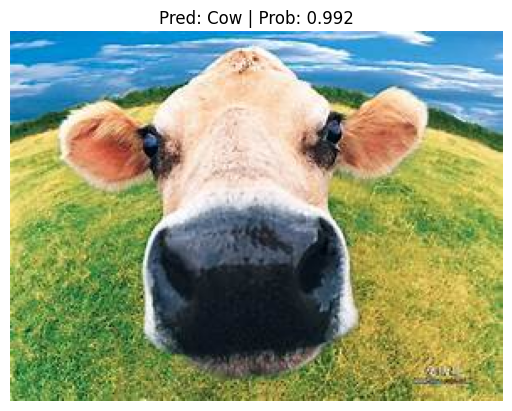

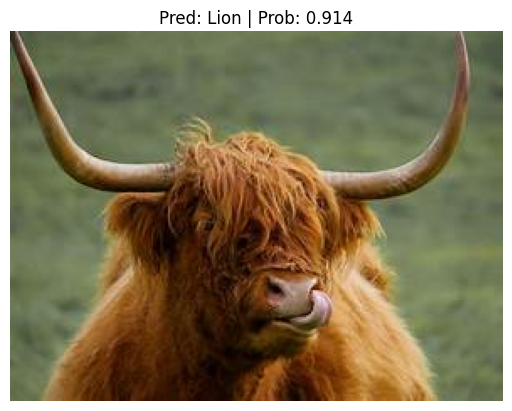

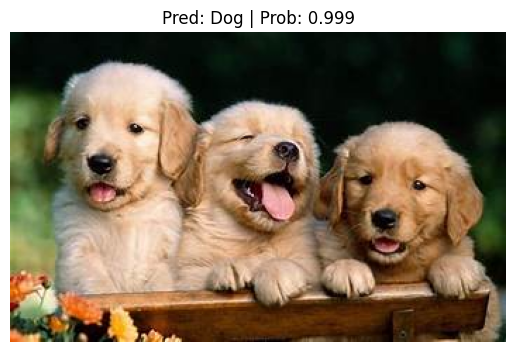

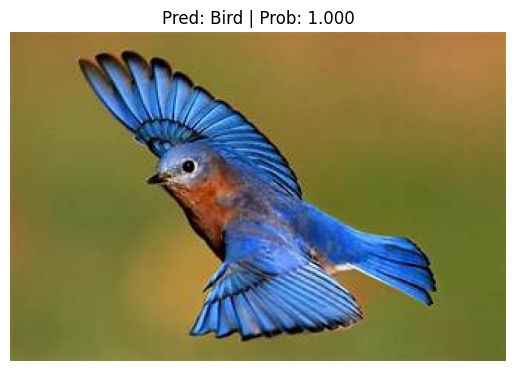

In [14]:
# Get a random list of image paths from the test set
import random

test_image_path_list = list(Path(Custom_image_path).glob("*.jpeg"))
num_images_to_plot = len(test_image_path_list)
test_image_path_sample = random.sample(population=test_image_path_list,
                                       k=num_images_to_plot)

# Make predictions on and plot the images
for image_path in test_image_path_sample:
  pred_and_plot_image(model=best_model,
                      image_path=image_path,
                      class_names=class_names,
                      transform =best_transform
                      )

# **7. Observations**
The best model from the models we have tried was MobileNet with specifications:
1.  `Train_Loss` : 0.0368
2.  `Train_Acc` : 99.81%
3.  `Val_Loss` : 0.0653
4.  `Val_Acc` : 99.11%
5.  `Train_Time` : 5min 18secs
6.  `Test_Loss` : 0.457
7.  `Test_Acc` : 99.03%
8.  `Test_Time` : 0min 2secs
9.  `macro_avg_precision` : 0.99
10. `macro_avg_recall` : 0.99
11.`macro_avg_f1_score` : 0.99
